#Machine Learning Exercise - Multi-class dog breed classification

Libraries: TensorFlow 2.0 with Keras, and TensorFlow Hub

Kaggle competition details: https://www.kaggle.com/c/dog-breed-identification/overview/description

## 1. Problem
Identifying the breed of a dog given an image of a dog

## 2. Data
Data are downloaded from Kaggle - https://www.kaggle.com/c/dog-breed-identification/overview/description

## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

## 4. Features
* Deal with unstructured data (images) so this model will be using deep learning / transfer learning.
* Multi-class classification: 120 breeds (categories)
* Training Set: 10,000+ images
* Test Set: 10,000+ images

# Live Dog Vision Demonstration!
Please meet Momo, an important member of our family, and she just turned 2 years old when we took these shots! This multi-class classification works quite well and successfully returned Chihuahua when her face is mostly visible. To my amazement, the breed detection model works even when I am occupying majority of the space in the image! Absolutely loving it!

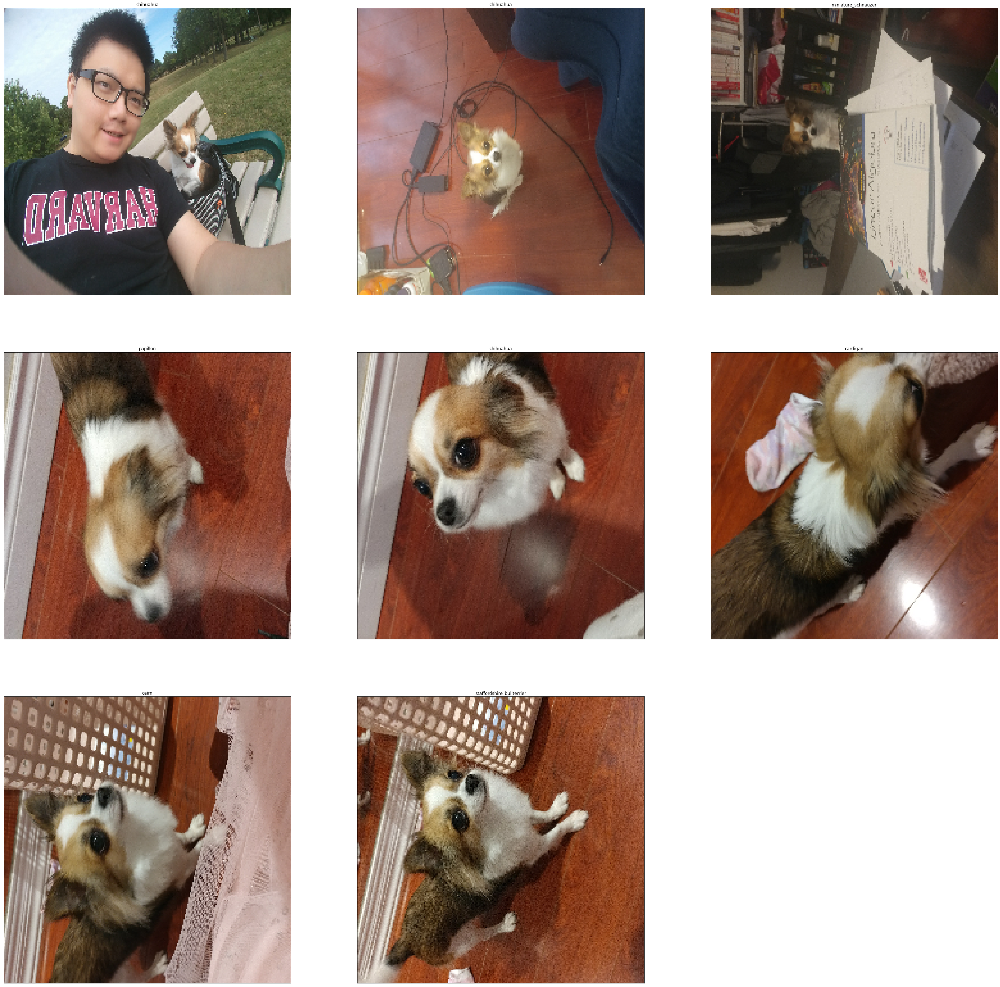

In [78]:
show()

## Data preparation and exploration


In [1]:
# Unzip the file and store images in the folder 
# !unzip "/content/drive/MyDrive/Colab Notebooks/Dog_Vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Colab Notebooks/Dog_Vision/"

In [2]:
# Import Pandas and Numpy
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
print("Pandas version:", pd.__version__)
print("NumPy version:", np.__version__)

# Import TensorFlow and Tensorflow Hub libraries
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

Pandas version: 1.1.5
NumPy version: 1.19.5
TF version: 2.6.0
TF Hub version: 0.12.0
GPU available


In [3]:
## Getting our data ready - all data need to be in numerical representation

In [4]:
# Checkout the labels of our data
labels_csv = pd.read_csv("drive/My Drive/Colab Notebooks/Dog_Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     d060e6fe84298ef6a37e3a0b9775c0c9  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


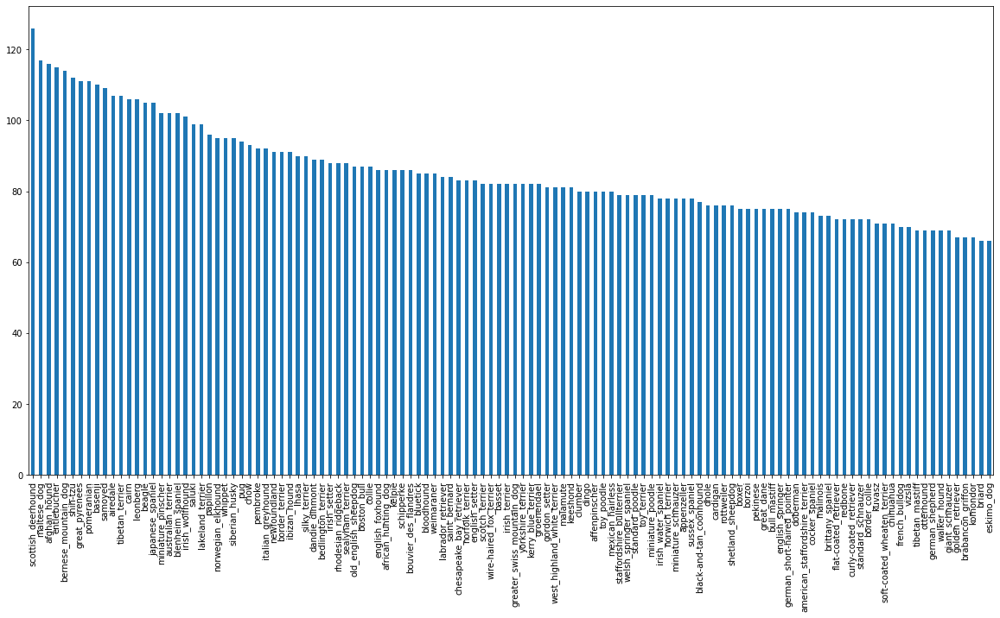

In [5]:
# Display the number of images per breed in the traiing set 
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [6]:
# Check average and median number of images by breed
print("Average number of images:" + str(labels_csv["breed"].value_counts().mean()))
print("Median number of images: " + str(labels_csv["breed"].value_counts().median()))

Average number of images:85.18333333333334
Median number of images: 82.0


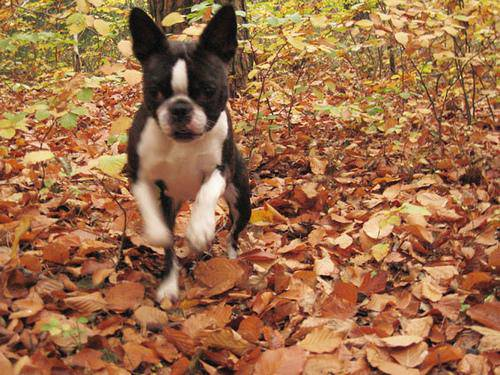

In [7]:
# View a sample image
from IPython.display import Image
Image("drive/My Drive/Colab Notebooks/Dog_Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [8]:
# Create path names
filenames = ["drive/My Drive/Colab Notebooks/Dog_Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 5 path names
filenames[:5]

['drive/My Drive/Colab Notebooks/Dog_Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Colab Notebooks/Dog_Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Colab Notebooks/Dog_Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Colab Notebooks/Dog_Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Colab Notebooks/Dog_Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

In [9]:
# Check the folder directory
import os
os.listdir("drive/My Drive/Colab Notebooks/Dog_Vision/train/")[:5]

['dbf58e6de2a26b9f6f26c1c8723af964.jpg',
 'e58621674644d3729585675ecf09c091.jpg',
 'dca86fc4e9461bb4fc110bf1e13274ed.jpg',
 'e93aa36e6a6951470a703ffb9020e9c4.jpg',
 'e07277bc6a6a0da06598b3ad43a011b2.jpg']

In [10]:
# Check if the number of filenames matches the number of actual image files
import os
if len(os.listdir("drive/My Drive/Colab Notebooks/Dog_Vision/train/")) == len(filenames):
  print("Filenames match the number of files. Now we can proceed.")
else:
  print("Filenames do not match the number of files, check the target directory.")

Filenames match the number of files. Now we can proceed.


In [11]:
# Prepare labels
labels = labels_csv["breed"].to_numpy()

labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [12]:
# Check if the number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches the number of filenames!")
else:
  print("Number of labels does not match the number of filenames!")

Number of labels matches the number of filenames!


In [13]:
# Find the unique label values
unique_breeds = np.unique(labels)
print(len(unique_breeds)) # Recall we have 120 breeds
unique_breeds

120


array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [14]:
# Turn a single label into an array of booleans where true is the correct label
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [15]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [16]:
# Create validation set: X & y variables
X = filenames
y = boolean_labels

In [17]:
# Experiment with first 2000 images
NUM_IMAGES = 2000 # @param {type:"slider", min: 1000, max: 10000, step:500}

In [18]:
# Use Sklearn to split our data to training and validation sets
from sklearn.model_selection import train_test_split

# Split the data into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state = 0)

# Make sure we have the correct size
len(X_train), len(y_train), len(X_val), len(y_val)

(1600, 1600, 400, 400)

In [19]:
# Preprocessing Images (Turning images into tensors):
# 1. Take an image filepath as input
# 2. Use TensorFlow to read the file and save it to a variable
# 3. Turn our images into tensors
# 4. Normalize our images
# 5. Resize the image to be a shape of (224,224)
# 6. Return the modified image

In [20]:
# Convert image to Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[0])
image.shape

(375, 500, 3)

In [21]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size = IMG_SIZE):
  '''
  Takes an image file path and turns the image into a Tensor
  '''
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels = 3)
  # Convert the colour channel values from 0 - 255 to 0 - 1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size to (224,224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

In [22]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  '''
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  '''
  image = process_image(image_path)
  return image, label


In [23]:
# Define the batch size, 32 based on Yann Lecun
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y = None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  '''
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  '''
  # Create test data batch and there's no labels for test data
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # Create validation batch data and there's no need to shuffle
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  
  # Training data batch
  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffle
    data = data.shuffle(buffer_size = len(X))

    # Create (image, label) tuples. this also turns the image path into a preprocessed image
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

    return data_batch


In [24]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [25]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [26]:
# Visualizing data batches

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  '''
  Displays a plot of 25 images and their labels from a data batch.
  '''
  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    # plt.axis("off")

In [27]:
# Build a model
# Define the followings:
# 1. The input shape
# 2. The output shape
# 3. The URL of the model we want to use

In [28]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds) # number of unique labels

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [29]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE, 
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model's goal is to reduce the losses
      optimizer=tf.keras.optimizers.Adam(), # Use default optimizer: Adam
      metrics=["accuracy"] # Our goal is to increase accuracy
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting
  
  return model


In [30]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [31]:
# Create Tensorboard callback
%load_ext tensorboard

In [32]:
import datetime

# Create a function to build a Tensorboard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Colab Notebooks/Dog_Vision/logs",
                        # Make it so the logs get tracked
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [33]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

In [34]:
# Training a model
NUM_EPOCHS = 200 #@param {type:"slider", min:10, max:500, step:10}

In [35]:
# Check GPU status again before running
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


In [36]:
# Create a function that trains model
def train_model():
  """
  Trains a given model and returns the trained version
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [37]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/200
50/50 [==============================] - 649s 12s/step - loss: 3.6138 - accuracy: 0.2556 - val_loss: 1.9168 - val_accuracy: 0.5450
Epoch 2/200
50/50 [==============================] - 8s 154ms/step - loss: 0.8251 - accuracy: 0.8413 - val_loss: 1.1536 - val_accuracy: 0.6975
Epoch 3/200
50/50 [==============================] - 9s 174ms/step - loss: 0.3206 - accuracy: 0.9663 - val_loss: 1.0109 - val_accuracy: 0.7050
Epoch 4/200
50/50 [==============================] - 8s 154ms/step - loss: 0.1739 - accuracy: 0.9881 - val_loss: 0.9386 - val_accuracy: 0.7275
Epoch 5/200
50/50 [==============================] - 8s 155ms/step - loss: 0.1104 - accuracy: 0.9950 - val_loss: 0.9024 - val_accuracy: 0.7375
Epoch 6/200
50/50 [==============================] - 8s 153ms/step - loss: 0.0793 - accuracy: 0.9987 - val_loss: 0.8947 - val_accuracy: 0.7325
Epoch 7/200
50/50 [==============================

In [38]:
# Checking the TensorBoard logs
%tensorboard --logdir drive/MyDrive/Colab\ Notebooks/Dog_Vision/logs

<IPython.core.display.Javascript object>

In [39]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1) # verbose shows us how long there is to go
predictions

13/13 [==============================] - 9s 108ms/step


array([[5.9538729e-06, 2.6514856e-06, 3.8934773e-05, ..., 5.9288914e-06,
        5.6591121e-05, 3.6533665e-06],
       [7.1337272e-05, 2.3081357e-04, 6.4362562e-06, ..., 8.4174002e-07,
        6.7542342e-06, 2.0547297e-06],
       [3.0042874e-02, 1.0996563e-03, 1.9032013e-05, ..., 4.1730407e-05,
        1.0844042e-05, 8.9362776e-03],
       ...,
       [1.0240999e-04, 2.2549844e-05, 9.6551262e-02, ..., 1.4979000e-03,
        6.6794478e-06, 1.3148116e-05],
       [1.4174939e-04, 8.4163767e-06, 1.4345523e-05, ..., 9.3693607e-06,
        5.1994998e-02, 6.2195366e-05],
       [1.3359556e-05, 8.4333988e-07, 4.9605746e-06, ..., 1.3609161e-06,
        1.1641642e-06, 2.1786070e-06]], dtype=float32)

In [40]:
# Make prediction based on index
index = 0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[5.95387291e-06 2.65148560e-06 3.89347733e-05 9.04526241e-05
 3.17569265e-06 8.82426320e-06 4.73803884e-05 5.95211588e-07
 2.03615967e-02 1.23272752e-04 1.82467429e-05 2.04010212e-06
 1.31186622e-03 3.50571713e-06 1.68748767e-04 9.71465111e-01
 4.47830780e-06 1.26830457e-06 4.63063270e-06 5.07051664e-05
 2.24710197e-06 5.74164187e-06 5.65517325e-07 4.29861132e-07
 9.16855606e-06 1.11626446e-06 6.83458484e-06 1.17907553e-06
 4.91097853e-06 1.28208985e-05 6.19279081e-06 1.19589480e-04
 8.15630556e-05 5.40548001e-07 1.86176312e-05 4.44074394e-05
 2.51188631e-05 9.45506144e-06 1.59346760e-04 3.49330396e-04
 5.15300664e-04 1.07199567e-05 9.78702519e-05 3.47978266e-06
 8.33152626e-07 1.34359434e-05 3.63439503e-05 1.74541812e-04
 1.17134396e-05 8.31609850e-06 6.09721974e-05 1.31962888e-05
 1.85929582e-06 5.52852522e-04 3.58653983e-06 2.57041074e-06
 3.06356674e-06 4.78537686e-06 9.76679530e-06 4.50460357e-06
 8.92114895e-06 1.79706825e-04 1.99605779e-06 5.30296438e-06
 2.35410662e-05 2.323132

In [41]:
# Turn prediction probabilities into their respective label
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'bluetick'

In [42]:
images_ = []
labels_ = []

# Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(image)

In [43]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) tensors and returns separate arrays of images and labels.
  """
  images =[]
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29803923, 0.5647059 , 0.41176474],
         [0.358701  , 0.6186275 , 0.4690564 ],
         [0.3746324 , 0.61844367, 0.4844363 ],
         ...,
         [0.5106618 , 0.64007354, 0.5185049 ],
         [0.5713236 , 0.70073533, 0.58026963],
         [0.6117647 , 0.7411765 , 0.627451  ]],
 
        [[0.3051996 , 0.5647059 , 0.41534492],
         [0.31048042, 0.56324655, 0.41725564],
         [0.3146084 , 0.5540004 , 0.41809106],
         ...,
         [0.48856536, 0.61797714, 0.4964085 ],
         [0.5350183 , 0.6644301 , 0.5439644 ],
         [0.57238275, 0.7017945 , 0.588069  ]],
 
        [[0.33940828, 0.5948792 , 0.43915445],
         [0.30195355, 0.54780316, 0.40121076],
         [0.2962602 , 0.52595884, 0.3873013 ],
         ...,
         [0.5072025 , 0.63661426, 0.5217508 ],
         [0.51819843, 0.6476102 , 0.5338497 ],
         [0.5351016 , 0.66451335, 0.55749303]],
 
        ...,
 
        [[0.5377628 , 0.6027837 , 0.46217617],
         [0.5304813 , 0.59550214, 0.45489

In [44]:
get_pred_label(labels[0])

'affenpinscher'

In [45]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove tickets
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                  np.max(pred_prob)*100,
                                  true_label),
                                  color=color)
  

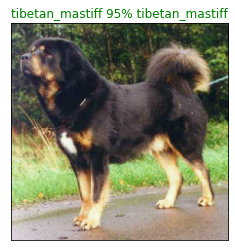

In [46]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=1)

In [47]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

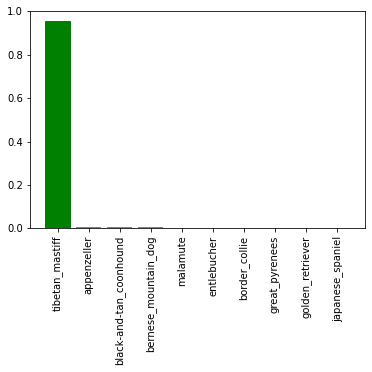

In [48]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=1)

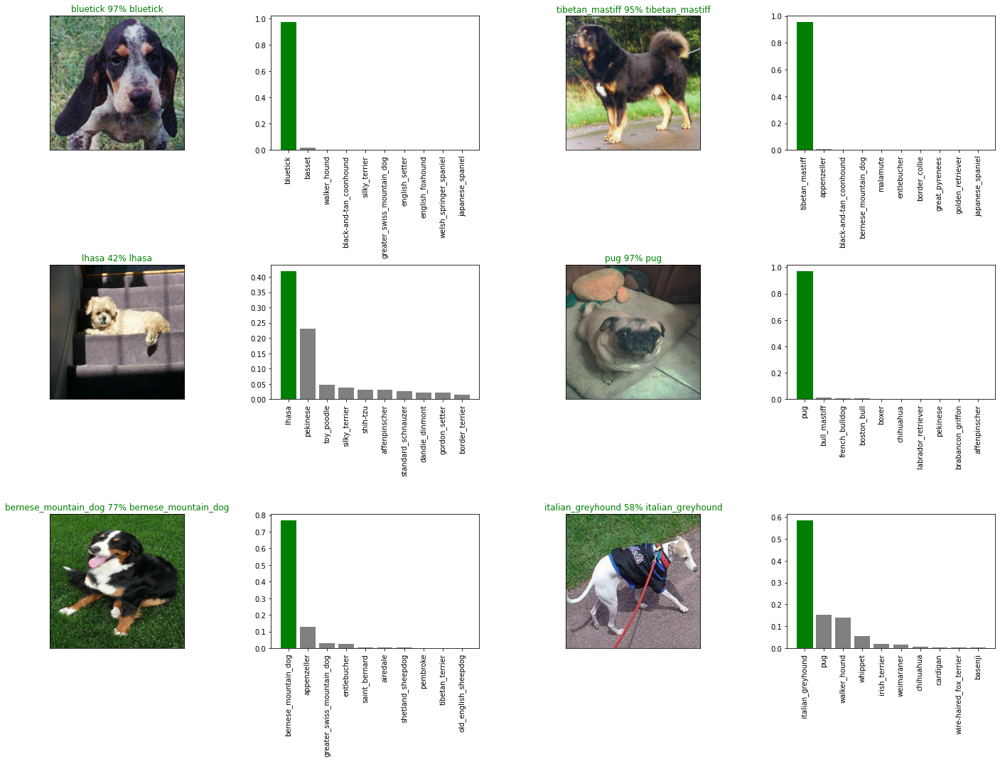

In [49]:
# Let's check out a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10 * num_cols, 5 * num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
  plot_pred(prediction_probabilities = predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [50]:
# Saving and reloading a trained model

# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """

  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Colab Notebooks/Dog_Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path


In [51]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Load a saved model from a specified path
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"kerasLayer":hub.KerasLayer})
  return model

In [52]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Colab Notebooks/Dog_Vision/models/20211029-19461635536773-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Colab Notebooks/Dog_Vision/models/20211029-19461635536773-1000-images-mobilenetv2-Adam.h5'

In [53]:
# Evaluate the pre-saved model
model.evaluate(val_data)

13/13 [==============================] - 2s 116ms/step - loss: 0.8602 - accuracy: 0.7325


[0.8601663708686829, 0.7325000166893005]

# Train a model on the full dataset (10,000+ images)

In [54]:
# Training a model on the full dataset
len(X), len(y)

(10222, 10222)

In [55]:
# Create a data batch with the full data set
full_data = create_data_batches(X,y)

Creating training data batches...


In [56]:
# Check data before running
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [57]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [58]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on all data so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [59]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/200
320/320 [==============================] - 2625s 8s/step - loss: 1.3342 - accuracy: 0.6685
Epoch 2/200
320/320 [==============================] - 40s 126ms/step - loss: 0.3978 - accuracy: 0.8809
Epoch 3/200
320/320 [==============================] - 40s 124ms/step - loss: 0.2362 - accuracy: 0.9349
Epoch 4/200
320/320 [==============================] - 39s 122ms/step - loss: 0.1536 - accuracy: 0.9642
Epoch 5/200
320/320 [==============================] - 39s 122ms/step - loss: 0.1056 - accuracy: 0.9779
Epoch 6/200
320/320 [==============================] - 39s 123ms/step - loss: 0.0776 - accuracy: 0.9872
Epoch 7/200
320/320 [==============================] - 39s 122ms/step - loss: 0.0580 - accuracy: 0.9917
Epoch 8/200
320/320 [==============================] - 40s 125ms/step - loss: 0.0468 - accuracy: 0.9935
Epoch 9/200
320/320 [==============================] - 40s 126ms/step - loss: 0.0385 - accuracy: 0.9954
Epoch 10/200
320/320 [==============================] - 39s 122ms

In [60]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Colab Notebooks/Dog_Vision/models/20211029-20431635540212-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Colab Notebooks/Dog_Vision/models/20211029-20431635540212-1000-images-mobilenetv2-Adam.h5'

In [61]:
# Making predictions on the test dataset
# Lodad test image filenames
test_path = "/content/drive/MyDrive/Colab Notebooks/Dog_Vision/test"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:5]

['/content/drive/MyDrive/Colab Notebooks/Dog_Vision/teste2888231cedd08540816e629c0733922.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog_Vision/teste41802f671c437c10e843400dcea40fb.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog_Vision/teste48f3d4f0514a07f4777a30f01d32ea9.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog_Vision/teste4a6892fb0e5c0680edc17138089d93c.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog_Vision/teste62be234fa4a073e375af9f724261378.jpg']

In [62]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data = True)

Creating test data batches...


In [66]:
# Preparing test dataset prediction for Kaggle
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [67]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [69]:
# Save the predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("/content/drive/MyDrive/Colab Notebooks/Dog_Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

In [70]:
# Make predictions on my dog !!!
custom_path = "/content/drive/MyDrive/Colab Notebooks/Dog_Vision/myDogs/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [71]:
custom_image_paths

['/content/drive/MyDrive/Colab Notebooks/Dog_Vision/myDogs/000000005.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog_Vision/myDogs/000000006.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog_Vision/myDogs/000000007.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog_Vision/myDogs/000000009.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog_Vision/myDogs/000000011.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog_Vision/myDogs/000000014.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog_Vision/myDogs/000000016.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog_Vision/myDogs/000000018.jpg']

In [72]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [73]:
# Make predictions on the custom data
custom_preds = full_model.predict(custom_data)

In [74]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['chihuahua',
 'chihuahua',
 'miniature_schnauzer',
 'papillon',
 'chihuahua',
 'cardigan',
 'cairn',
 'staffordshire_bullterrier']

In [75]:
# Get custom images
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)
  

In [77]:
def show():
  plt.figure(figsize = (50,50))
  for i, image in enumerate(custom_images):
    plt.subplot(3,3,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.title(custom_pred_labels[i])
    plt.imshow(image)

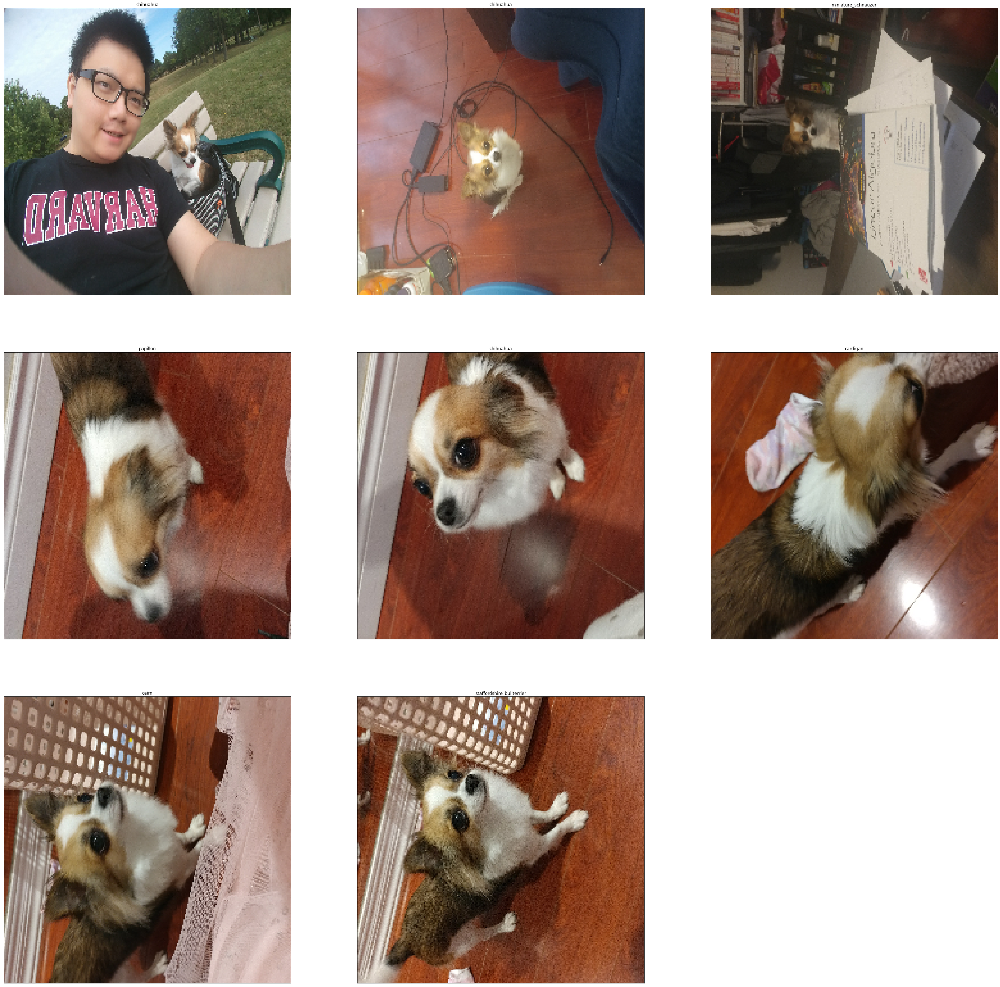

In [76]:
# Check custom image prediction
plt.figure(figsize = (50,50))
for i, image in enumerate(custom_images):
  plt.subplot(3,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)